In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid", palette="bright")
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MaxAbsScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import RobustScaler

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/bank-additional-full.csv", sep=';')

In [ ]:
#df.replace('unknown', np.nan, inplace=True)

# DP

In [ ]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,41188.0,NaN,NaN,NaN,40.02406,10.42125,17.0,32.0,38.0,47.0,98.0
job,41188,12,admin.,10422,NaN,NaN,NaN,NaN,NaN,NaN,NaN
marital,41188,4,married,24928,NaN,NaN,NaN,NaN,NaN,NaN,NaN
education,41188,8,university.degree,12168,NaN,NaN,NaN,NaN,NaN,NaN,NaN
default,41188,3,no,32588,NaN,NaN,NaN,NaN,NaN,NaN,NaN
housing,41188,3,yes,21576,NaN,NaN,NaN,NaN,NaN,NaN,NaN
loan,41188,3,no,33950,NaN,NaN,NaN,NaN,NaN,NaN,NaN
contact,41188,2,cellular,26144,NaN,NaN,NaN,NaN,NaN,NaN,NaN
month,41188,10,may,13769,NaN,NaN,NaN,NaN,NaN,NaN,NaN
day_of_week,41188,5,thu,8623,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Count the occurrences of 'unknown' in each column of the dataframe
unknown_counts = df.apply(lambda x: x.value_counts().get('unknown', 0))

# Print the counts of 'unknown' before replacement
print("Counts of 'unknown' before replacement:")
print(unknown_counts)

# Replace 'unknown' with NaN in the entire dataframe
df.replace('unknown', np.nan, inplace=True)

# Initialize a SimpleImputer with strategy 'most_frequent'
imputer = SimpleImputer(strategy='most_frequent')

# Iterate through each column in the dataframe
for column in df.columns:

    # Check if the column has any missing values
    if df[column].isnull().any():

        # Extract the column data and reshape it for imputation
        column_data = df[column].values.reshape(-1, 1)

        # Use the imputer to fill missing values with the most frequent value
        transformed_data = imputer.fit_transform(column_data)

        # Update the dataframe column with the imputed values
        df[column] = pd.Series(transformed_data.flatten(), index=df.index)

# Count the occurrences of 'unknown' in each column of the dataframe after replacement
unknown_counts = df.apply(lambda x: x.value_counts().get('unknown', 0))

# Print the counts of 'unknown' after replacement
print("Counts of 'unknown' after replacement:")
print(unknown_counts)


Counts of 'unknown' before replacement:
age                  0
job                330
marital             80
education         1731
default           8597
housing            990
loan               990
contact              0
month                0
day_of_week          0
duration             0
campaign             0
pdays                0
previous             0
poutcome             0
emp.var.rate         0
cons.price.idx       0
cons.conf.idx        0
euribor3m            0
nr.employed          0
y                    0
dtype: int64
Counts of 'unknown' after replacement:
age               0
job               0
marital           0
education         0
default           0
housing           0
loan              0
contact           0
month             0
day_of_week       0
duration          0
campaign          0
pdays             0
previous          0
poutcome          0
emp.var.rate      0
cons.price.idx    0
cons.conf.idx     0
euribor3m         0
nr.employed       0
y                 0
dtype

### Short Data Analysis:

#### Age:
- The age distribution ranges from 17 to 98 years.
- The average age is approximately 40 years.
- No outliers are apparent in the age data.

#### Job:
- There are 12 unique job categories.
- The most frequent job is "admin."
- Job distribution appears to be diverse.

#### Marital Status:
- There are 4 unique marital statuses.
- "Married" is the most common marital status.

#### Education:
- There are 8 unique education levels.
- "University degree" is the most common education level.

#### Default, Housing, Loan:
- Most clients have no default, housing, or loan.

#### Contact:
- The majority of contacts are made via cellular communication.

#### Month and Day of Week:
- The most common month for contact is May.
- Thursday (thu) is the most common day for contact.

#### Duration:
- Call duration varies widely, with a mean of approximately 258 seconds.
- There are potential outliers, as the maximum duration is 4918 seconds.

#### Campaign:
- The number of contacts during the campaign ranges from 1 to 56.
- The average number of contacts is approximately 2.57.

#### Pdays:
- Most clients were not previously contacted.
- A value of 999 indicates no previous contact.

#### Previous:
- The majority of clients have not been contacted previously.

#### Poutcome:
- The most common outcome of the previous marketing campaign is "nonexistent."

#### Economic Indicators (emp.var.rate, cons.price.idx, cons.conf.idx, euribor3m, nr.employed):
- These indicators show variation in economic conditions during the campaign.

#### Y (Target Variable):
- The target variable "y" indicates whether a client subscribed to a term deposit.
- The majority did not subscribe (class imbalance).

In [ ]:
# Limiting the duration values to 2000 seconds for potential outliers
# Any duration greater than 2000 seconds will be capped at 2000 seconds
df.loc[df['duration'] >  2000, 'duration'] = 2000
df['duration'].describe()

count    41188.000000
mean       257.407085
std        251.153397
min          0.000000
25%        102.000000
50%        180.000000
75%        319.000000
max       2000.000000
Name: duration, dtype: float64

In [ ]:
# Replacing values of 'pdays' equal to 999 with NaN (indicating no previous contact)
df.loc[df['pdays'] == 999, 'pdays'] = -1
df['pdays'].describe()

count    41188.000000
mean        -0.741988
std          1.510327
min         -1.000000
25%         -1.000000
50%         -1.000000
75%         -1.000000
max         27.000000
Name: pdays, dtype: float64

In [ ]:
#Function
def normalize_column(df, col_name):
    # Extract the specified column
    column_to_normalize = df[col_name].values.reshape(-1, 1)

    # Use RobustScaler to normalize the data
    scaler = RobustScaler()
    normalized_data = scaler.fit_transform(column_to_normalize)

    # Replace the original column with the normalized values
    df[col_name] = normalized_data.flatten()

    return df

#for col in df.columns:
#    normalize_column(df, col)

In [ ]:
# Replacing categorical values in the 'y' column with numerical equivalents
# 'no' is replaced with 0, and 'yes' is replaced with 1
df['y'].replace({"no": 0,"yes": 1 }, inplace=True)
df['y'].describe()

count    41188.000000
mean         0.112654
std          0.316173
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: y, dtype: float64

# EDA

## Numeric

In [ ]:
def plot_distribution(df, col, xl, yl, tit, legend_label=None):
    sns.displot(df[col], kind="kde",label=legend_label)
    plt.xlabel(xl)
    plt.ylabel(yl)
    plt.title(tit)
    plt.legend()
    plt.show()

In [ ]:
'''def pairvs(data, y_vars, x_vars):
    sns.pairplot(data=data, kind='scatter',
                y_vars=y_vars,
                x_vars=x_vars)
    plt.show()'''


def plot_barplot_numeric(df, col, xl, yl, tit, legend_label=None):
        agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')

        sns.barplot(x=col, y='count', hue='y', data=agg_data, palette='Set2')
        plt.title("Normalized bar plot")
        plt.xticks(rotation=45)
        plt.xlabel(xl)
        plt.ylabel(yl)
        plt.title(tit)
        plt.show()

In [ ]:
def plot_distribution_hist(df, col, xl, yl, tit, legend_label=None):
        #dist_counts = df[col].value_counts()
        # Use sns.histplot instead of plt.hist
        sns.histplot(df[col], edgecolor='black', label=legend_label)
        #print(dist_counts)
        plt.xlabel(xl)
        plt.ylabel(yl)
        plt.title(tit)
        plt.show()

### Age

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


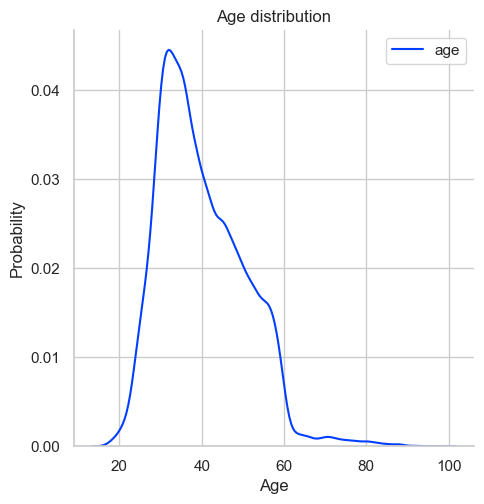

In [ ]:
plot_distribution(df, 'age', 'Age', 'Probability', 'Age distribution', legend_label='age')

The plot indicates that the most common ages in the dataset are around 30, with a steady decline in frequency as age increases. The long right tail suggests that there are relatively few older individuals in the dataset, but they are not completely absent.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


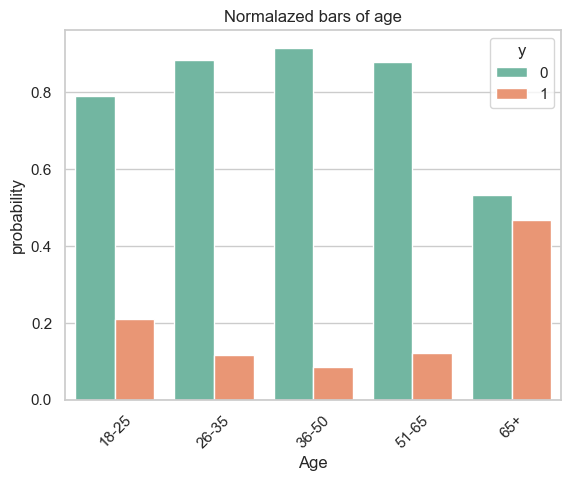

In [ ]:
df['age_range'] = pd.cut(x=df['age'], bins=[17,25,35,50,65,100], labels=['18-25', '26-35', '36-50','51-65', '65+'])
plot_barplot_numeric(df, 'age_range', 'Age', 'probability', 'Normalazed bars of age', legend_label=None)

The majority of individuals in each age group appear to have responded with 'no', and there is a significant age-based variation in the proportion of 'yes' responses, especially in the 65+ category.

### Duration

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


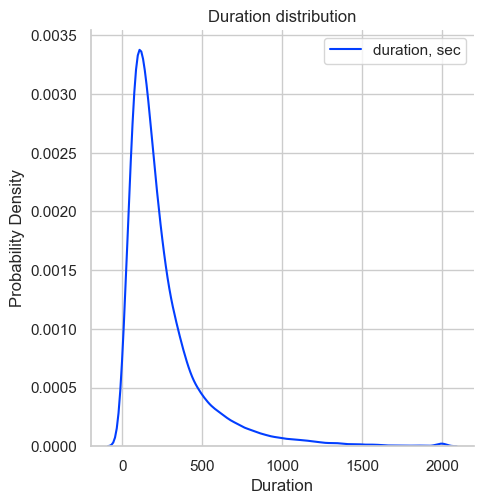

In [ ]:
plot_distribution(df, 'duration', 'Duration', 'Probability Density', 'Duration distribution', legend_label='duration, sec')

Most of the calls are around 200 seconds With right tail that extends up to 2000 seconds.

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


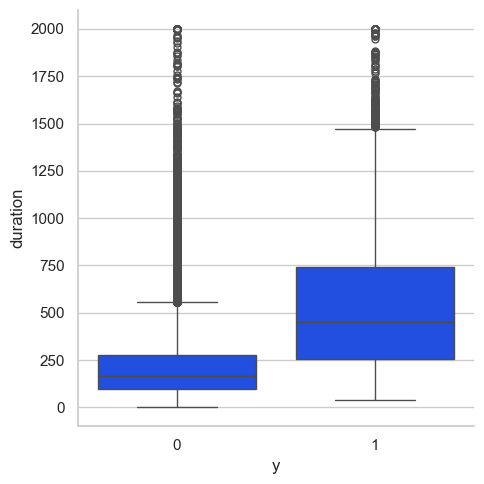

In [ ]:
sns.catplot(y='duration', x='y', data=df, kind='box')

The less the contact is with the potential customer, the less chances deposit occurs

### Emp.var.rate

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


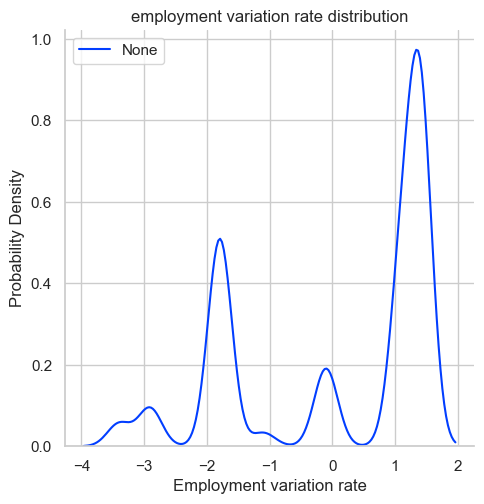

In [ ]:
plot_distribution(df, 'emp.var.rate', 'Employment variation rate', 'Probability Density', 'employment variation rate distribution', legend_label='None')

There are three distinct peaks, suggesting that the employment variation rate takes on three common values. This could indicate that there are distinct groups within the data.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


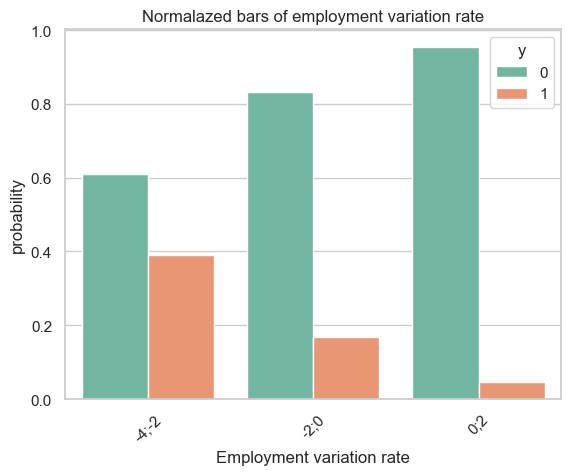

In [ ]:
df['emp.var.rate_range'] = pd.cut(x=df['emp.var.rate'], bins=[-4,-2,0,2], labels=['-4;-2', '-2;0', '0;2'])
plot_barplot_numeric(df, 'emp.var.rate_range', 'Employment variation rate', 'probability', 'Normalazed bars of employment variation rate', legend_label=None)

Here we can see that the lower the employment variaton, the lower is the ratio between 0s and 1s. Meaning, the "yes" outcome is more likely.

### Campaign

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


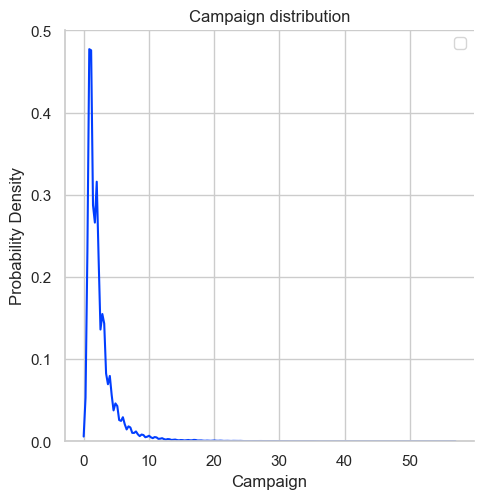

In [ ]:
plot_distribution(df, 'campaign', 'Campaign', 'Probability Density', 'Campaign distribution', legend_label=None)

The plot peaks sharply near zero, suggesting that number of the calls is very low.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


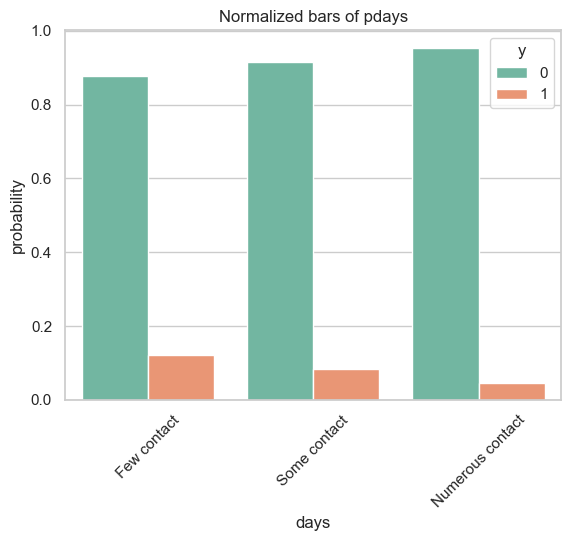

In [ ]:
df['Nb_of_campaign'] = pd.cut(x=df['campaign'], bins=[0.99,3,6,100], labels=['Few contact', 'Some contact', 'Numerous contact'])
plot_barplot_numeric(df, 'Nb_of_campaign', 'days', 'probability', 'Normalized bars of pdays', legend_label=None)

The less contact you have with the potential client, the more chances you have to conclude with a term deposit

### Pdays

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


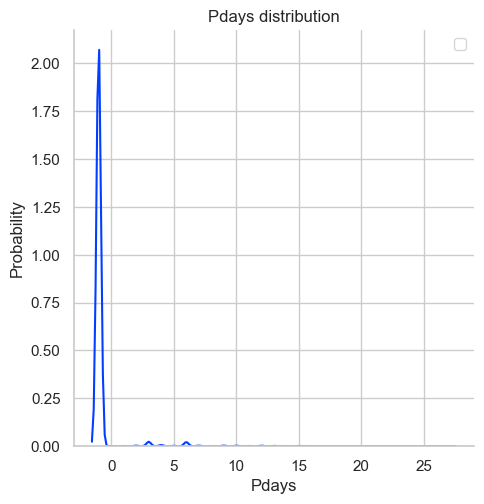

In [ ]:
plot_distribution(df, 'pdays', 'Pdays', 'Probability', 'Pdays distribution', legend_label=None)

The plot shows two primary peaks, which suggests that the "Pdays" variable has two modes.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


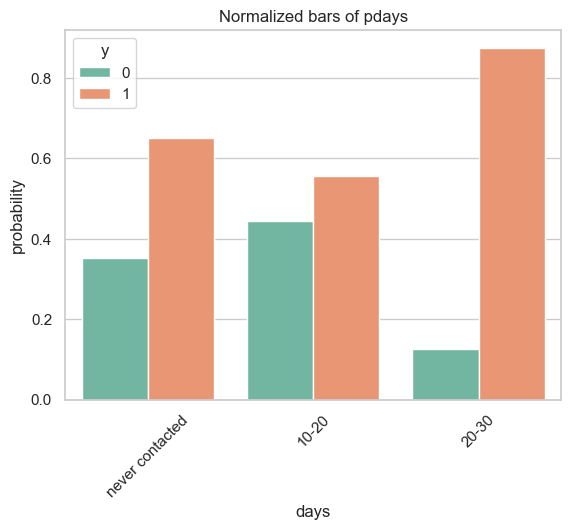

In [ ]:
df['pdays_range'] = pd.cut(x=df['pdays'], bins=[-1,10,20,30], labels=['never contacted','10-20', '20-30',])
plot_barplot_numeric(df, 'pdays_range', 'days', 'probability', 'Normalized bars of pdays', legend_label=None)

It's evident that re-engaging with potential customers is beneficial. The deposit rate consistently improves at nearly every stage when contact is made compared to no contact.

The principle of "the sooner, the better" is not necessarily straightforward. It's prudent to allow individuals some time for contemplation before reaching out again.

The likelihood of individuals committing to a term deposit is notably high between 20 and 30 days compared to other periods. This timeframe proves to be an optimal range for reconnecting with them!

### Previous

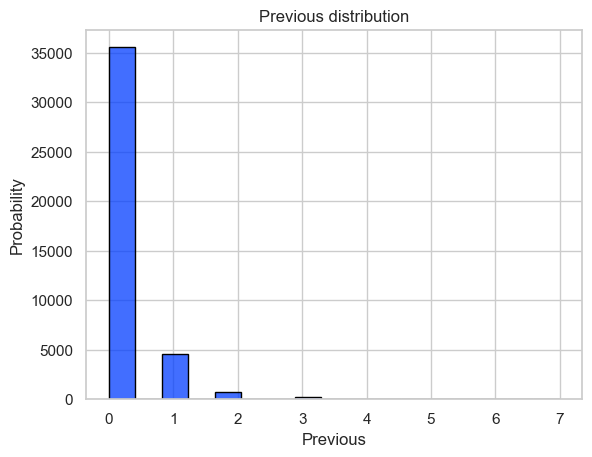

In [ ]:
plot_distribution_hist(df, 'previous', 'Previous', 'Probability', 'Previous distribution')

This variable considers the total number of contacts the bank has had with the client. In this sample, the majority of individuals contacted were new clients.

In [ ]:
never_contacted = df.loc[df['previous']==0]
contacted = df.loc[df['previous']!=0]

print("Never contacted")
display(never_contacted['y'].value_counts(normalize=True))

print("Contacted")
display(contacted['y'].value_counts(normalize=True))

Never contacted


y
0    0.911678
1    0.088322
Name: proportion, dtype: float64

Contacted


y
0    0.733511
1    0.266489
Name: proportion, dtype: float64

The improved outcome can be attributed to the prior contact with the client. This may be due to:

1. Establishing a trusted relationship with the client before the campaign, leading to increased comfort and familiarity with the bank.

2. The client being more informed about the potential benefits offered by the bank prior to exposure to the campaign, contributing to a more receptive response.

### Cons.price.idx

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


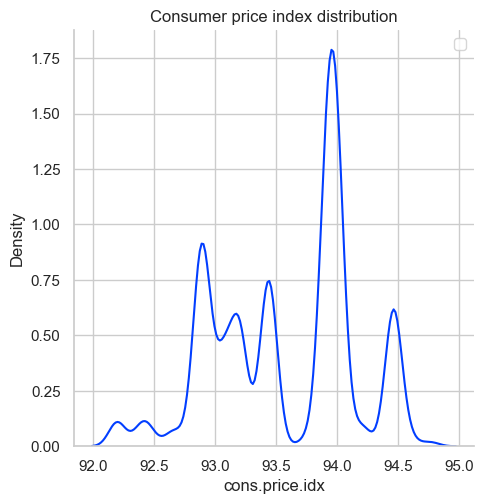

In [ ]:
plot_distribution(df, 'cons.price.idx', 'cons.price.idx', 'Density', 'Consumer price index distribution', legend_label=None)

The most significant peaks are near the values 92.5, 93.5, 94.0, and 94.5. These peaks indicate the most frequent values of the consumer price index in the dataset.
The multiple peaks and troughs suggest that the consumer price index within this dataset is quite volatile, with several common values rather than a single one.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


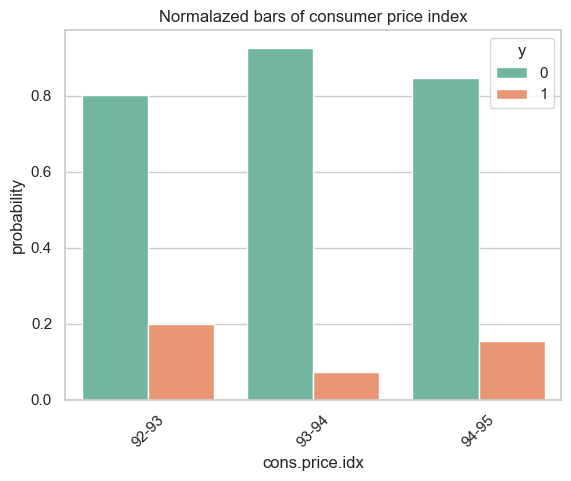

In [ ]:
df['cons.price.idx_range'] = pd.cut(x=df['cons.price.idx'], bins=[92,93,94,95], labels=['92-93', '93-94', '94-95'])
plot_barplot_numeric(df, 'cons.price.idx_range', 'cons.price.idx', 'probability', 'Normalazed bars of consumer price index', legend_label=None)

There appears to be a downward trend in the 93-94 range

### Cons.conf.idx

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


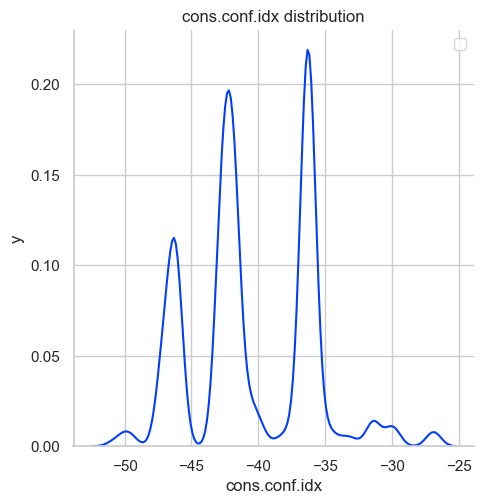

In [ ]:
plot_distribution(df, 'cons.conf.idx', 'cons.conf.idx', 'y', 'cons.conf.idx distribution', legend_label=None)

There are 3 peaks and an outlier around -30

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


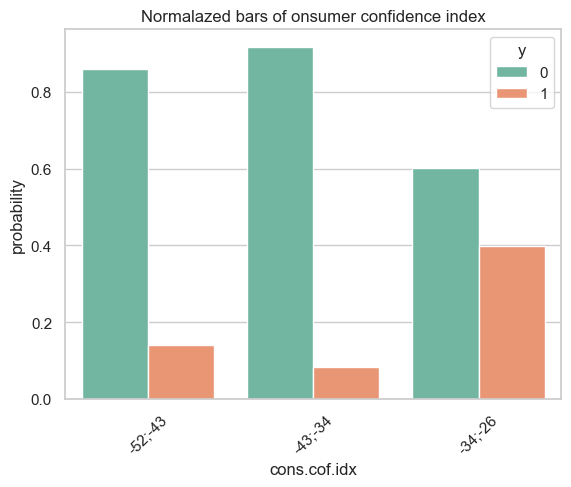

In [ ]:
'''columns=[ 'cons.conf.idx','cons.price.idx','previous', 'campaign','duration','age','euribor3m', 'nr.employed', 'emp.var.rate', 'pdays']
pairvs(df[columns], ['cons.conf.idx'], columns[1:])'''
df['cons.conf.idx_range'] = pd.cut(x=df['cons.conf.idx'], bins=[-52, -43,-34,-26], labels=['-52;-43', '-43;-34', '-34;-26'])
plot_barplot_numeric(df, 'cons.conf.idx_range', 'cons.cof.idx', 'probability', 'Normalazed bars of onsumer confidence index', legend_label=None)

The 'yes' outcome for last range is very more likely than for the other two ranges suggesting that the higher the value is, the positive outcomes there are

### Euribor3m

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


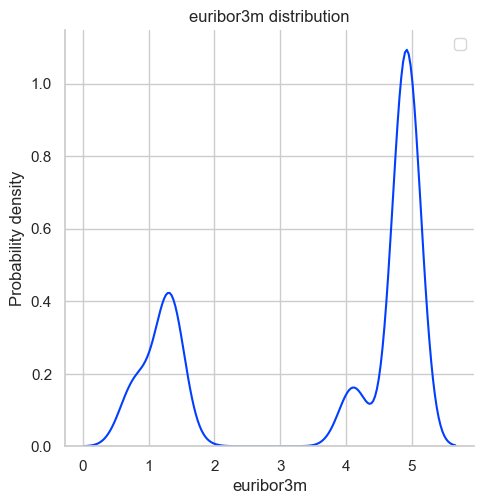

In [ ]:
plot_distribution(df, 'euribor3m', 'euribor3m', 'Probability density', 'euribor3m distribution', legend_label=None)

The sharpness of the peaks suggests that the euribor3m rates cluster around these values rather than being evenly distributed across the range.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


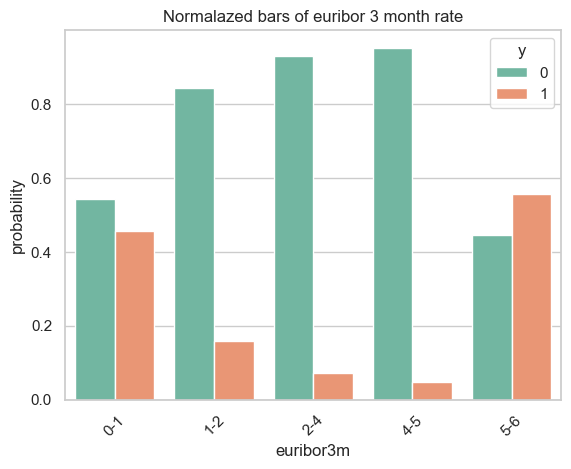

In [ ]:
df['euribor3m_range'] = pd.cut(x=df['euribor3m'], bins=[0,1,2,4,5,6], labels=['0-1', '1-2', '2-4','4-5', '5-6'])
plot_barplot_numeric(df, 'euribor3m_range', 'euribor3m', 'probability', 'Normalazed bars of euribor 3 month rate', legend_label=None)

The green bars are consistently higher than the orange bars across all euribor3m ranges, suggesting that overall, loans are more often not given regardless of the euribor3m rate.
There is an exception in the '5-6' range where the orange bar approaches the green bar's height, indicating a higher probability of loans being given in this interest rate range compared to the others.

This data is not interesting for us, so it makes sense to drop the column

In [ ]:
df=df.drop(['euribor3m'], axis=1)

### Nr.employed

C:\Users\user\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


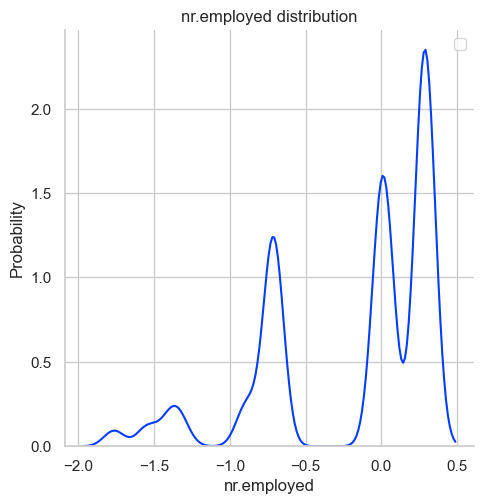

In [ ]:
normalize_column(df, 'nr.employed')
plot_distribution(df, 'nr.employed', 'nr.employed', 'Probability', 'nr.employed distribution', legend_label=None)

The highest peak is near 0.5, which might suggest that this "nr.employed" value has the highest concentration of data points in the dataset.
The sharpness of the peaks in the KDE plot suggests that "nr.employed" has specific common values around which data points are clustered.

C:\Users\user\AppData\Local\Temp\ipykernel_14576\4085117804.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')


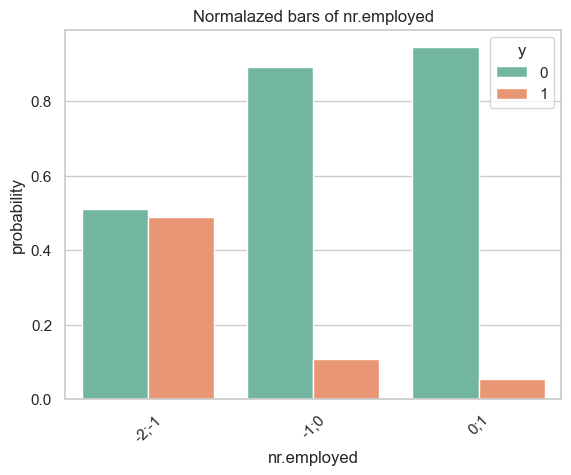

In [ ]:
df['nr.employed_range'] = pd.cut(x=df['nr.employed'], bins=[-2,-1,0,1], labels=['-2;-1', '-1;0', '0;1'])
plot_barplot_numeric(df, 'nr.employed_range', 'nr.employed', 'probability', 'Normalazed bars of nr.employed', legend_label=None)

The lesser the quarterly indicator is, the more likely it is for outcome to be true

In [ ]:
'''columns=['nr.employed', 'euribor3m','cons.conf.idx','cons.price.idx','previous', 'campaign','duration','age', 'emp.var.rate', 'pdays']
for col in columns:
    normalize_column(df, col)'''

"columns=['nr.employed', 'euribor3m','cons.conf.idx','cons.price.idx','previous', 'campaign','duration','age', 'emp.var.rate', 'pdays']\nfor col in columns:\n    normalize_column(df, col)"

## Categorical

In [ ]:
def plot_normalized_bar(df, col, xl, yl, tit, legend_label=None):
        dist_counts = df[col].value_counts(normalize=True)
        # Use sns.barplot
        sns.barplot(x=dist_counts.index, y=dist_counts.values)
        plt.xticks(rotation=45)
        plt.xlabel(xl)
        plt.ylabel(yl)
        plt.title(tit)
        plt.show()

In [ ]:
def plot_barplot(df, col, xl, yl, tit, legend_label=None):
        agg_data = df.groupby(col)['y'].value_counts(normalize = True).reset_index(name='count')

        sns.barplot(x=col, y='count', hue='y', data=agg_data, palette='Set2')
        plt.title("Normalized bar plot")
        plt.xticks(rotation=45)
        plt.xlabel(xl)
        plt.ylabel(yl)
        plt.title(tit)
        plt.show()

### Job

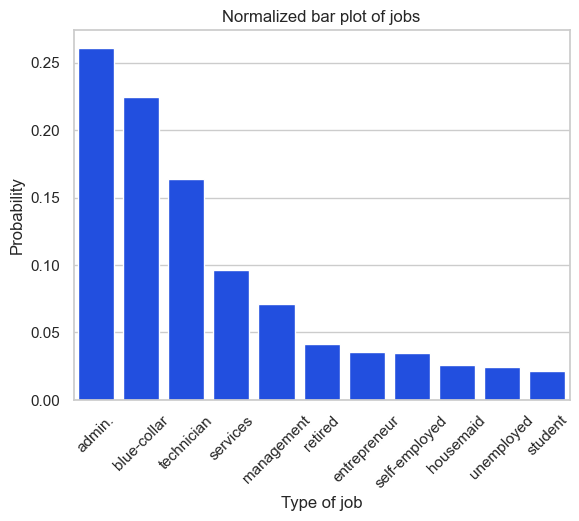

In [ ]:
columns=['job', 'marital','education','default','housing','loan','contact', 'month', 'day_of_week', 'poutcome']
xlabel = ['Type of job', 'Marital status','Education','Has credit in default','Has housing loan','Has personal loan','Contact communication type', 'Last contact month of year', 'Last contact day of the week', 'Outcome of the previous marketing campaign']
#ylabel = ['Frequency', 'Частота','Частота','Частота','cons.price.idx','cons.conf.idx','euribor3m', 'nr.employed']
titles = ['Bar plot of jobs', 'Bar plot of marital','Bar plot of education','Bar plot of credit in default','Bar plot of housing loan','Bar plot of personal loan','Bar plot of communication type', 'Bar plot of last contact month of year', 'Bar plot of last contact day of the week', 'Bar plot of outcome of the previous marketing campaign']

plot_normalized_bar(df, 'job', 'Type of job', 'Probability', 'Normalized bar plot of jobs', None)

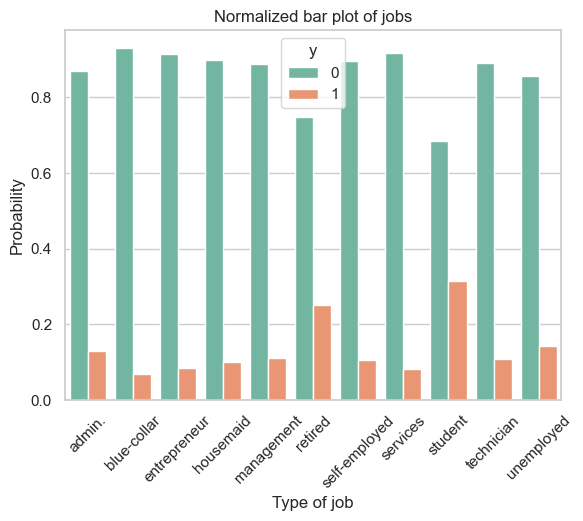

In [ ]:
plot_barplot(df, 'job', 'Type of job', 'Probability', 'Normalized bar plot of jobs')

### Marital

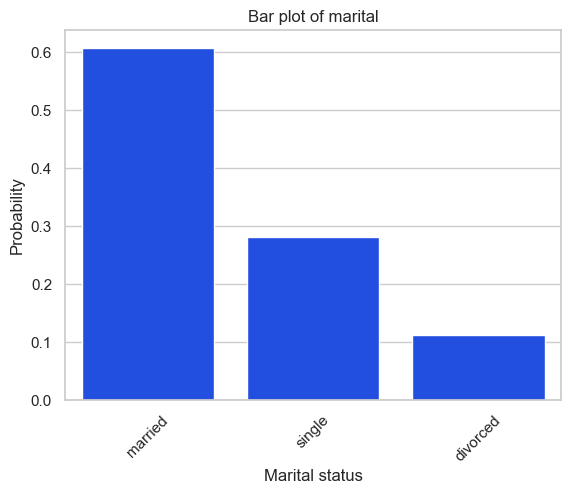

In [ ]:
plot_normalized_bar(df, 'marital', 'Marital status', 'Probability', 'Bar plot of marital', None)

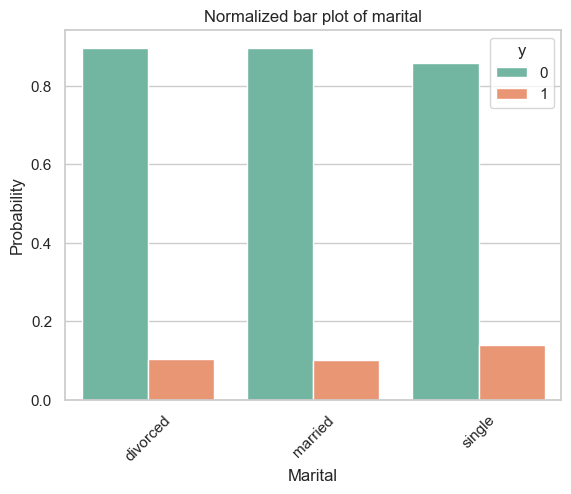

In [ ]:
plot_barplot(df, 'marital', 'Marital', 'Probability', 'Normalized bar plot of marital')

As we can see, the y-value is about the same, which means it makes sense to drop the column

In [ ]:
df=df.drop(['marital'], axis=1)

### Education

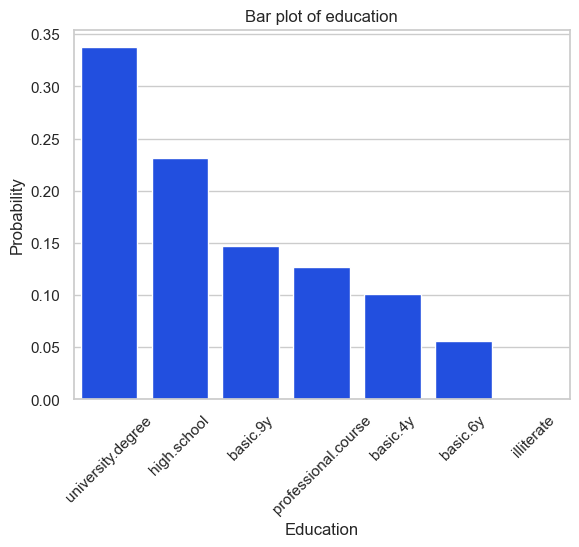

In [ ]:
plot_normalized_bar(df, 'education', 'Education', 'Probability', 'Bar plot of education', None)

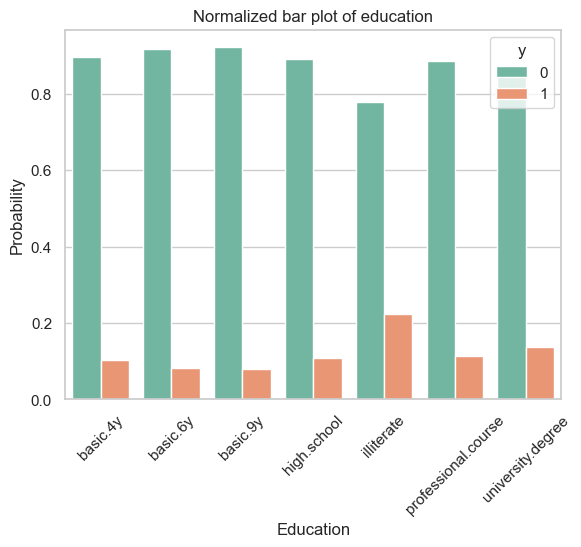

In [ ]:
plot_barplot(df, 'education', 'Education', 'Probability', 'Normalized bar plot of education')

### Default

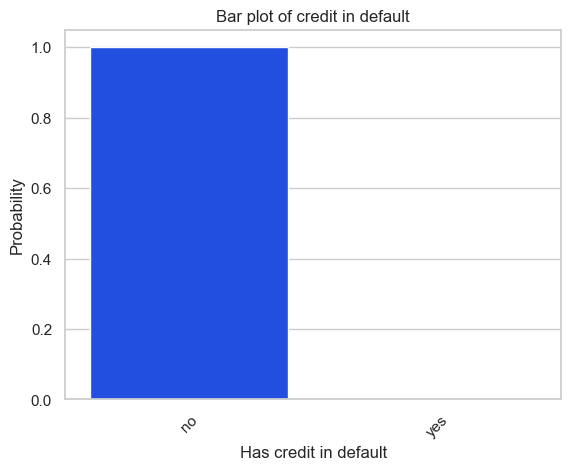

In [ ]:
plot_normalized_bar(df, 'default', 'Has credit in default', 'Probability', 'Bar plot of credit in default', None)

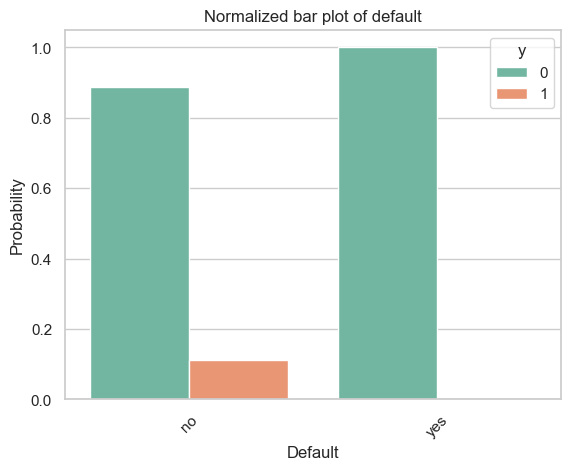

In [ ]:
plot_barplot(df, 'default', 'Default', 'Probability', 'Normalized bar plot of default')

As we can see, the y-value is about the same, which means it makes sense to drop the column
This data is not interesting for us, so it makes sense to drop the column

In [ ]:
df=df.drop(['default'], axis=1)

### Housing

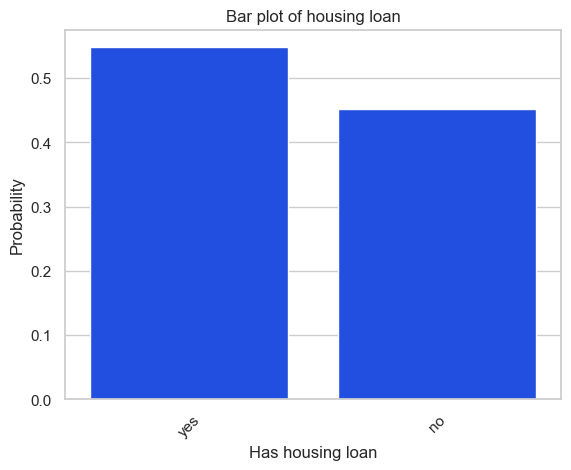

In [ ]:
plot_normalized_bar(df, 'housing', 'Has housing loan', 'Probability', 'Bar plot of housing loan', None)

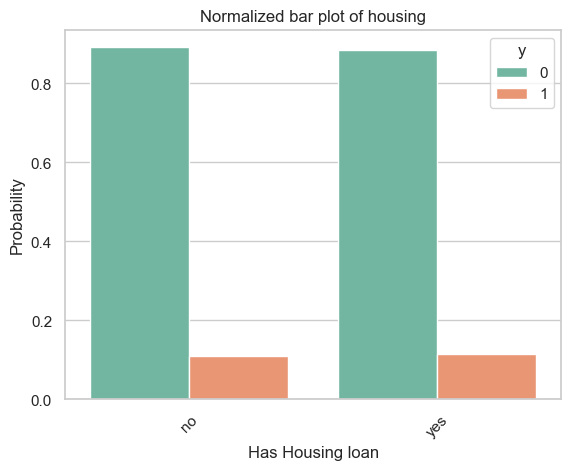

In [ ]:
plot_barplot(df, 'housing', 'Has Housing loan', 'Probability', 'Normalized bar plot of housing')

As we can see, the y-value is about the same, which means it makes sense to drop the column

In [ ]:
df=df.drop(['housing'], axis=1)

### Personal loan

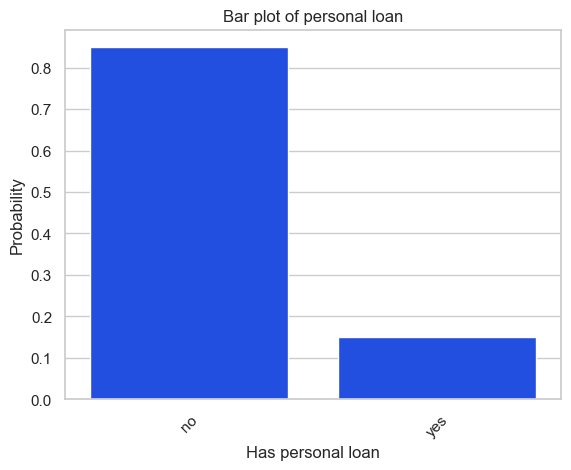

In [ ]:
plot_normalized_bar(df, 'loan', 'Has personal loan', 'Probability', 'Bar plot of personal loan', None)

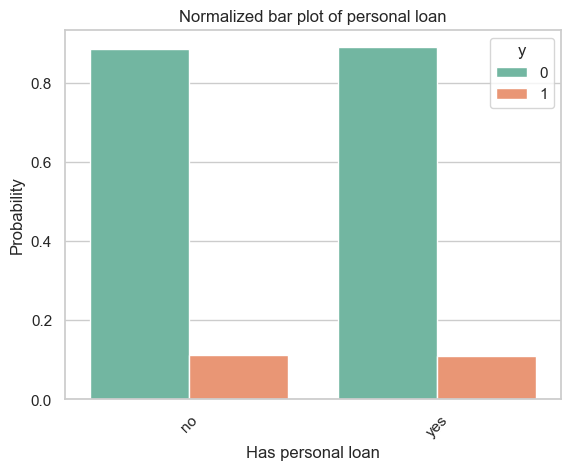

In [ ]:
plot_barplot(df, 'loan', 'Has personal loan', 'Probability', 'Normalized bar plot of personal loan')

As we can see, the y-value is about the same, which means it makes sense to drop the column

In [ ]:
df=df.drop(['loan'], axis=1)

### Communication type

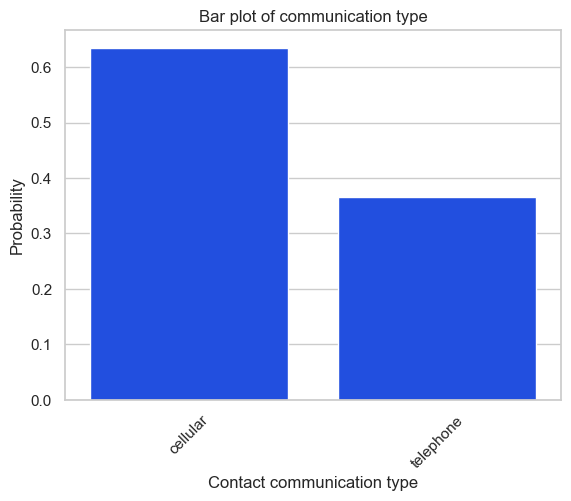

In [ ]:
plot_normalized_bar(df, 'contact', 'Contact communication type', 'Probability', 'Bar plot of communication type', None)

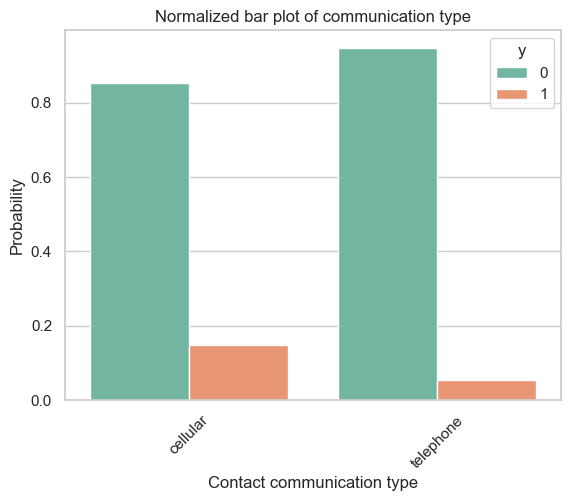

In [ ]:
plot_barplot(df, 'contact', 'Contact communication type', 'Probability', 'Normalized bar plot of communication type')

Being contacted by cellular is a better way to conclude a term deposit than another one

This data is not interesting for us, so it makes sense to drop the column

In [ ]:
df=df.drop(['contact'], axis=1)

### Month

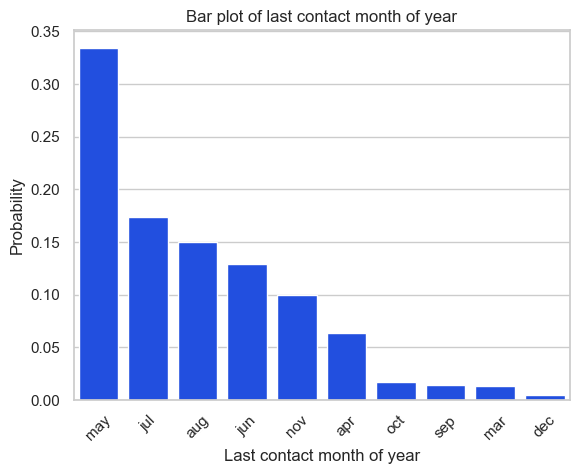

In [ ]:
plot_normalized_bar(df, 'month', 'Last contact month of year', 'Probability', 'Bar plot of last contact month of year', None)

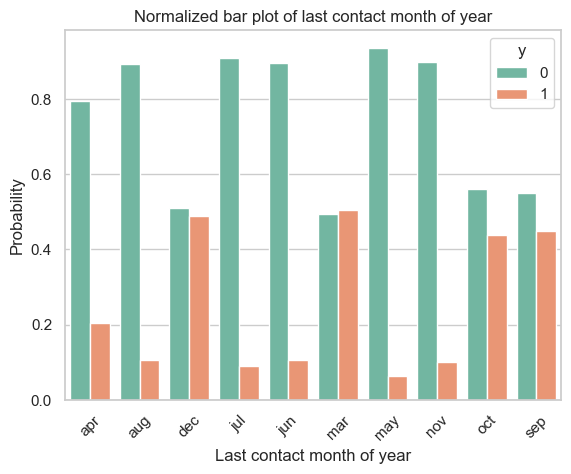

In [ ]:
plot_barplot(df, 'month', 'Last contact month of year', 'Probability', 'Normalized bar plot of last contact month of year')

### Day of week

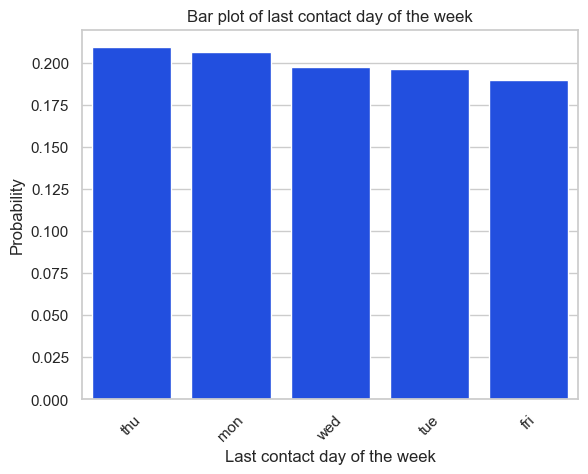

In [ ]:
plot_normalized_bar(df, 'day_of_week', 'Last contact day of the week', 'Probability', 'Bar plot of last contact day of the week', None)

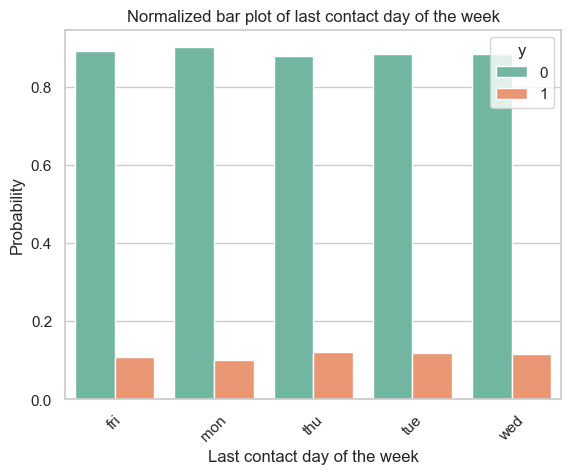

In [ ]:
plot_barplot(df, 'day_of_week', 'Last contact day of the week', 'Probability', 'Normalized bar plot of last contact day of the week')

As we can see, the y-value is about the same, which means it makes sense to drop the column

In [ ]:
df=df.drop(['day_of_week'],axis=1)

### Poutcome

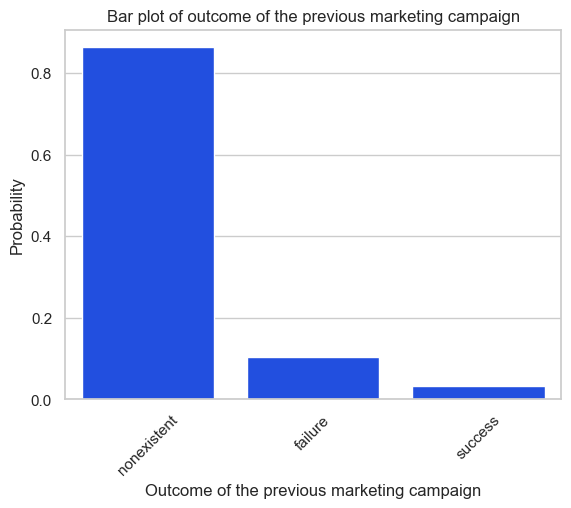

In [ ]:
plot_normalized_bar(df, 'poutcome', 'Outcome of the previous marketing campaign', 'Probability', 'Bar plot of outcome of the previous marketing campaign', None)

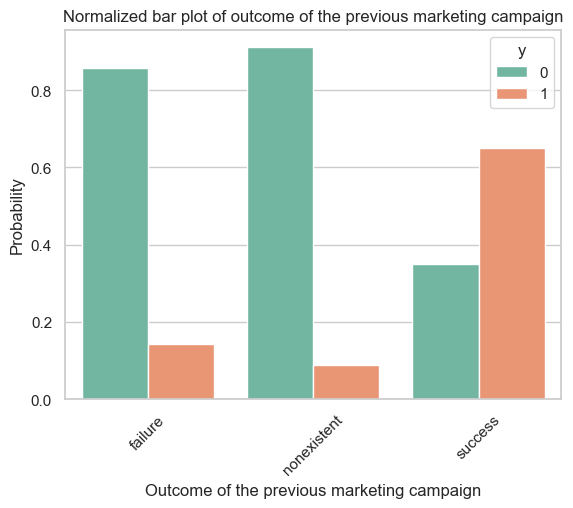

In [ ]:
plot_barplot(df, 'poutcome', 'Outcome of the previous marketing campaign', 'Probability', 'Normalized bar plot of outcome of the previous marketing campaign')

### Heatmap

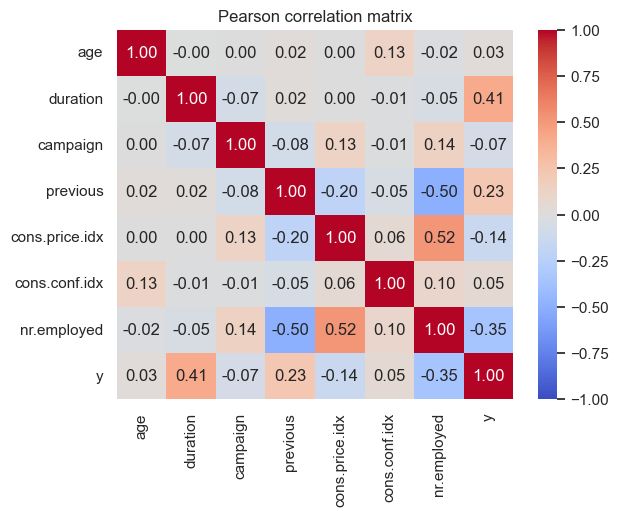

In [ ]:
subset = df[['age','duration', 'campaign','previous','cons.price.idx','cons.conf.idx','nr.employed','y']]
spearman_corr = subset.corr()
sns.heatmap(spearman_corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True, fmt=".2f")
plt.title("Pearson correlation matrix")
plt.show()

C:\Users\user\AppData\Local\Temp\ipykernel_14576\1245906415.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset[col] = [unique_values[i] for i in subset[col]]


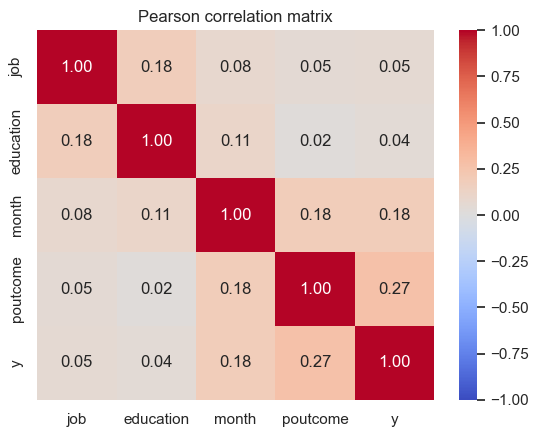

In [ ]:
columns=['job','education', 'month', 'poutcome', 'y']


subset = df[columns]
for col in columns:
    unique_values = subset[col].unique()
    unique_values = {val: ind for ind, val in enumerate(unique_values)}
    subset[col] = [unique_values[i] for i in subset[col]]


spearman_corr = subset.corr()
sns.heatmap(spearman_corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True, fmt=".2f")
plt.title("Pearson correlation matrix")
plt.show()


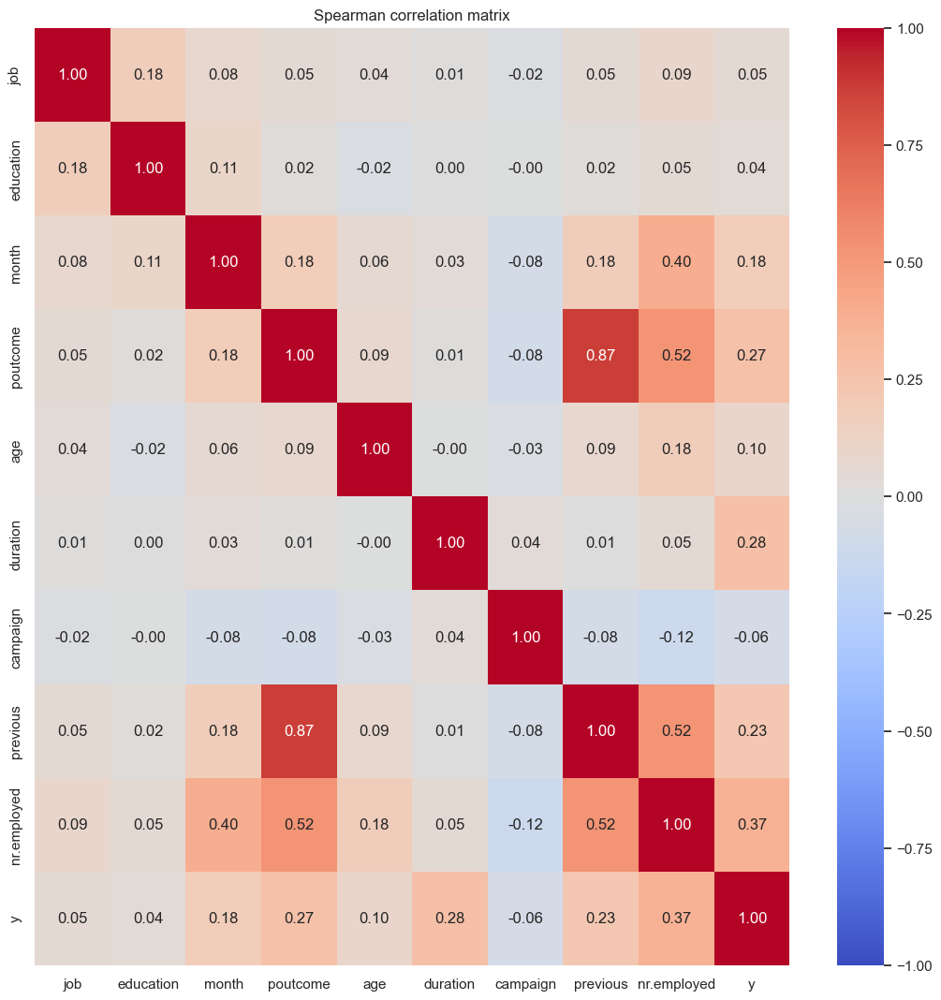

In [ ]:
columns=['job','education', 'month', 'poutcome', 'age','duration', 'campaign','previous','nr.employed','y']
#subset = df[['age','duration', 'campaign','previous','cons.price.idx','cons.conf.idx','nr.employed','y']]

df_copy = df[columns].copy()

for col in columns:
    unique_values = df_copy[col].unique()
    unique_values = {val: ind for ind, val in enumerate(unique_values)}
    df_copy[col] = [unique_values[i] for i in df_copy[col]]


spearman_corr = df_copy.corr()
plt.figure(figsize=(13, 13))
sns.heatmap(spearman_corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True, fmt=".2f")
plt.title("Spearman correlation matrix")
plt.show()

# DR

In [ ]:
# PCA
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

np.object = object
data = df.copy()
continious_features = data.select_dtypes("number").columns
categorical_features = data.select_dtypes(np.object).columns
pca = PCA(n_components=2)
age_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', MinMaxScaler()),
    ('variance_trsh', VarianceThreshold(threshold=0.1))
])
job_pipe = Pipeline([
    ("imputer", SimpleImputer(strategy='constant', fill_value='unknown')),
    ('ohe', OneHotEncoder(sparse_output=False, drop='first')),
    ('variance_trsh', VarianceThreshold(threshold=.98*(1-.98)))
])

pipe = ColumnTransformer(transformers=[
    ('age', age_pipe, continious_features),
    ('job', job_pipe, categorical_features)
])

data = pipe.fit_transform(data)


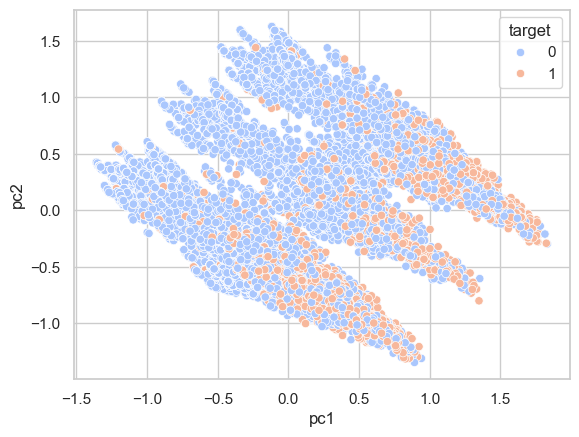

In [ ]:
pca = PCA(n_components=2)
x_pca2 = pca.fit_transform(data)

plot_df = pd.DataFrame.from_records(data=x_pca2[:,:2], columns=['pc1', 'pc2'])
y = ['y']
plot_df['target'] = df[y]
sns.scatterplot(x='pc1', y='pc2',hue='target', palette='coolwarm', data=plot_df)
plt.show()

In [ ]:
import plotly.express as px
pca = PCA(n_components=3)
x_pca3 = pca.fit_transform(data)

plot_df = pd.DataFrame.from_records(data=x_pca3[:,:3], columns=['pc1', 'pc2', 'pc3'])
y = ['y']
plot_df['target'] = df[y]
fig = px.scatter_3d(plot_df, x="pc1", y="pc2", z="pc3", color="target",
                    title="PCA visualization 3D")

fig.show()


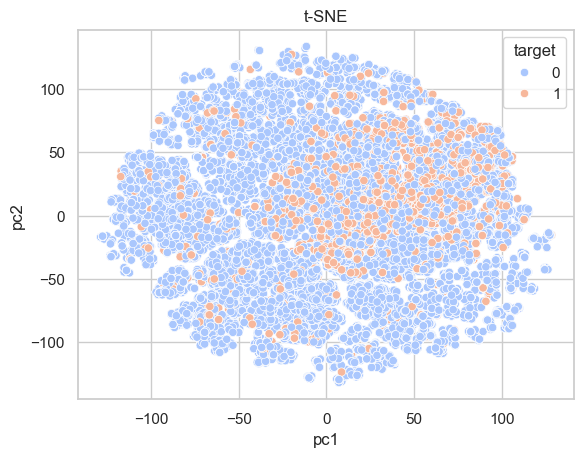

In [ ]:
tsne = TSNE()
tsne_X = tsne.fit_transform(data)

plot_df = pd.DataFrame.from_records(data=tsne_X,columns=['pc1', 'pc2'])
y = ['y']
plot_df['target'] = df[y]

sns.scatterplot(x='pc1', y='pc2',hue='target', palette='coolwarm', data=plot_df)
plt.title("t-SNE")
plt.show()


#plot_df = pd.DataFrame.from_records(data=x_pca2[:,:2], columns=['pc1', 'pc2'])



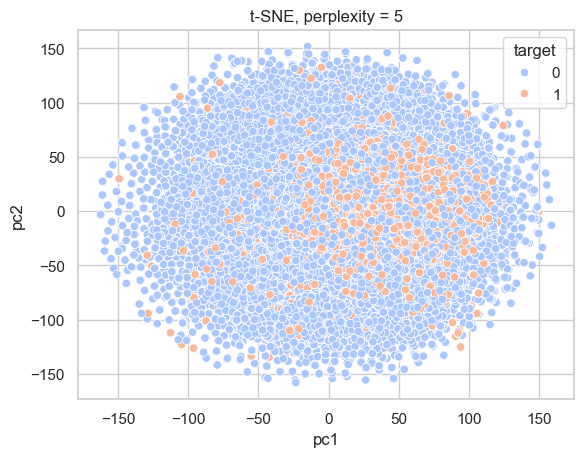

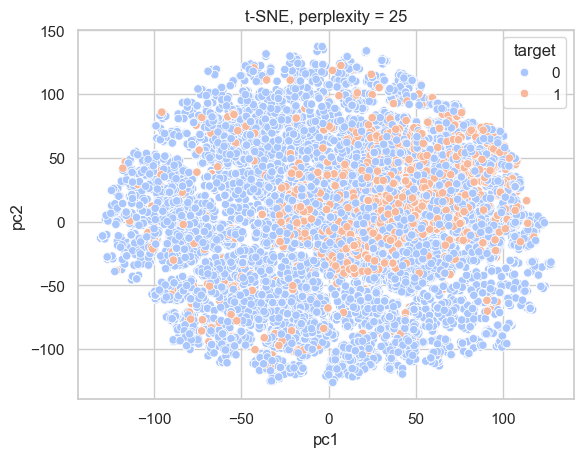

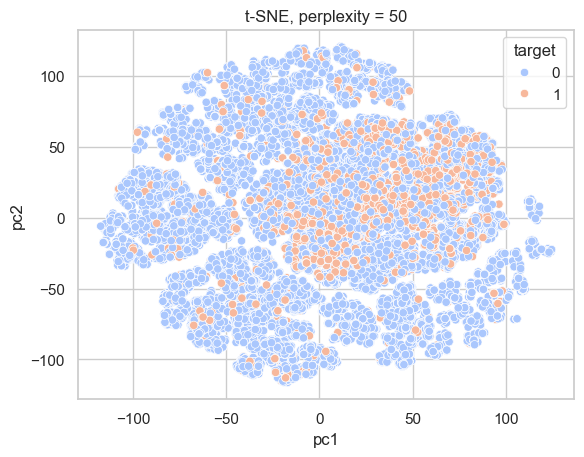

In [ ]:
perplexities = [5, 25, 50]
for item in perplexities:
  tsne = TSNE(perplexity = item)
  tsne_X = tsne.fit_transform(data)

  plot_df = pd.DataFrame.from_records(data=tsne_X,columns=['pc1', 'pc2'])
  y = ['y']
  plot_df['target'] = df[y]

  sns.scatterplot(x='pc1', y='pc2',hue='target', palette='coolwarm', data=plot_df)
  plt.title(f"t-SNE, perplexity = {item}")
  plt.show()

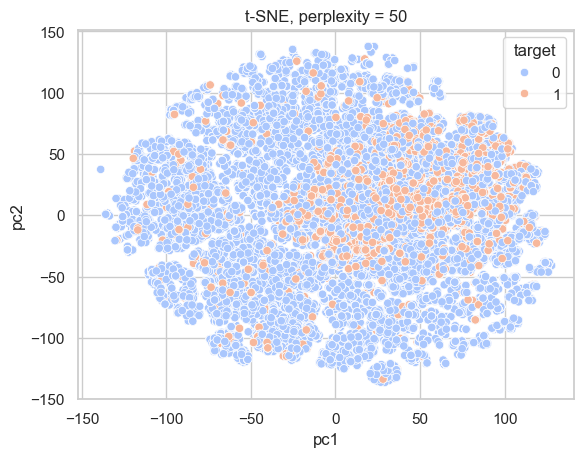

In [ ]:
pca = PCA(n_components=20)
X_pca30 = pca.fit_transform(data)

tsne = TSNE()
tsne_X = tsne.fit_transform(X_pca30)

plot_df = pd.DataFrame.from_records(data=tsne_X,columns=['pc1', 'pc2'])
y = ['y']
plot_df['target'] = df[y]

sns.scatterplot(x='pc1', y='pc2',hue='target', palette='coolwarm', data=plot_df)
plt.title(f"t-SNE, perplexity = {item}")
plt.show()

In [ ]:
tsne = TSNE(n_components=3)
tsne_X = tsne.fit_transform(X_pca30)

plot_df = pd.DataFrame.from_records(data=x_pca3[:,:3], columns=['pc1', 'pc2', 'pc3'])
y = ['y']
plot_df['target'] = df[y]
fig = px.scatter_3d(plot_df, x="pc1", y="pc2", z="pc3", color="target",
                    title="PCA visualization 3D")

fig.show()